## Auswertung Geopandas und klassisch von Kanton und Stadt
Herleitung und Versuche unter:
- **20 Kanton Auswertung Geopandas**
- **22 Stadt Zug Endprodukt Auswertung**
- **21 Stadt Zug Auswertung Geopandas**

In [1]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, LineString
%matplotlib inline
import matplotlib.pyplot as plt
import contextily as ctx # Für Hintergrundkarte
from shapely import wkt #um Poligon-Daten in Geometrie umzuwandeln
folderpath=r"C:\Users\Zoe\Desktop\maz-datenjournalismus\Daten_BR_Handelsreg"
folderpath_geo=r"C:\Users\Zoe\Desktop\maz-datenjournalismus\Geodaten"

Auf windows funktioniert die Instellation von contextil am besten via conda-Befehl. (anders gehts nicht)
- conda install contextily --channel conda-forge


# 1. Laden der Karte der Gemeinden 
Hier gefunden:
https://www.bfs.admin.ch/bfs/de/home/dienstleistungen/geostat/geodaten-bundesstatistik/administrative-grenzen/generalisierte-gemeindegrenzen.html


In [2]:
gdf_gemeinden = gpd.read_file(folderpath_geo+'/ggg_2019-LV95/shp/g1a19.shp')

In [3]:
gdf_zg=gdf_gemeinden[gdf_gemeinden["AName"]=="Zug"]

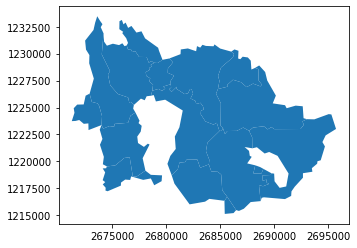

In [4]:
gdf_zg.plot()

## 1.1 Stadt Zug rausfiltern

In [16]:
gdf_stadtzug=gdf_zg[gdf_zg["GMDNAME"]=="Zug"]

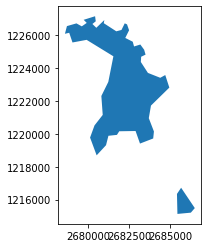

In [17]:
gdf_stadtzug.plot()

# File mit den HR-Daten 


In [ ]:
#df_sauber=pd.read_csv(folderpath+"/BRFrames/Kanton_ganz_mit_Vergleichswert")

In [ ]:
#dfhr=df_sauber[["Adresse", "Firmen","Telbuch","Vergleich", "GKODE","GKODN"]]

In [ ]:
#dfhr.dtypes

In [ ]:
# Nun nur jene Adressen rausfiltern, an welchen Firmen ansässig sind
#dfhr_pl=dfhr[dfhr["Firmen"]>0]

In [ ]:
# Noch eine Spalte kreieren mit der Wurzel aus der Anzahl Firmen (kann so evtl besser dargestellt werden)
#dfhr_pl["Wurzelwert"]=dfhr_pl["Firmen"]**(1/2)

In [ ]:
#dfhr_pl

In [ ]:
# Kreieren der Angabe der Geometrie. Mit Hilfe der Gemeindekoordinaten.
#dfhr_pl['Punkt'] = dfhr_pl.apply(lambda row: Point(row["GKODE"], row["GKODN"]), axis=1)

In [ ]:

#dfhr_pl

## Import File mit fehlenden Daten von Zefix  

In [ ]:
df_sauber_fehlende_adressen=pd.read_csv(folderpath+"/BRFrames/Adressen_alle3713_mit_telbuch_geocode_angepasst_ursprung_df.csv")
df_feh_geo=df_sauber_fehlende_adressen[["Adresse", "Firmen","Telbuch", "lat", "lon"]]
df_feh_geo['Punkt'] = df_feh_geo.apply(lambda row: Point(row["lon"], row["lat"]), axis=1)
gdf_feh=gpd.GeoDataFrame(df_feh_geo, geometry="Punkt")
gdf_feh.crs=({'init' :'epsg:4326'}) #CRS bestimmen
gdf_feh_ch=gdf_feh.to_crs(epsg=2056) # mal in die CH-Form umwandeln

In [ ]:
df_feh_geo

### Einschub: Rund 100 Adresse wurde nicht richtig erfasst. 
Ich filtere sie raus und lasse sie nochmals durch die Google API im File 301

In [ ]:
# Rund 100 Adressen sind falsch. Entspricht weniger als 0.5 Prozent. ok
df_feh_sau=df_feh_geo[(df_feh_geo["lat"].between(47,47.4))& (df_feh_geo["lon"].between(8.2, 8.7))]
df_feh_sau

In [ ]:
# Die falschen noch kurz anschauen: Keine auffälligen Adressen. Ich lasse es sein.
df_feh_falsch=df_feh_geo[(df_feh_geo["lat"].between(47,47.4))& (df_feh_geo["lon"].between(8.2, 8.7))==False]
df_feh_falsch.sort_values("Firmen", ascending=False)

In [ ]:
# Rausfiltern der 02 und 03-er fehler
df_feh_falsch["Adresse"]=df_feh_falsch["Adresse"].str.replace("02", "")
df_feh_falsch["Adresse"]=df_feh_falsch["Adresse"].str.replace("03", "")
df_feh_falsch.to_csv(folderpath+"/BRFrames/_Falsche_Geocodes_von_alle3713_mit_telbuch_.csv")

#### Hier dazwischen gehts in File 301 weiter. 
Danach wird es wieder hier eingelesen

In [ ]:
# Mit neuen Codes einlesen
df_update=pd.read_csv(folderpath+"/BRFrames/_Falsche_Geocodes_von_alle3713_neu_geocodiert")

In [ ]:
df_feh_erg=pd.merge(df_feh_falsch, df_update, on="Adresse", how="inner")

In [ ]:
df_feh_erg1=df_feh_erg[["Adresse", "Firmen", "Telbuch", "lat_y", "lon_y"]] # Jene die ich benötige wählen


In [ ]:
df_feh_erg1.columns=["Adresse", "Firmen", "Telbuch", "lat", "lon"]# Kolonnen umbenennen

In [ ]:
df_feh_erg2=df_feh_erg1[df_feh_erg1["lat"].str.contains("location")==False]

In [ ]:
#Long und latitude müssen noch in Float umgewandelt werden
df_feh_erg2["lat"]=df_feh_erg2["lat"].astype(float)

In [ ]:
df_feh_erg2["lon"]=df_feh_erg2["lon"].astype(float)

In [ ]:
# Noch die Point-Kolonne machen
df_feh_erg2['Punkt'] = df_feh_erg2.apply(lambda row: Point(row["lon"], row["lat"]), axis=1)

In [ ]:
df_neu_ganz=pd.concat((df_feh_sau, df_feh_erg2))

In [ ]:
df_neu_ganz

In [ ]:
#Nochmals kontrollieren, es fehlen noch rund 30. das nehmen wir hin.
df_neu_ganz_sauber=df_neu_ganz[(df_neu_ganz["lat"].between(47.07,47.27))& (df_neu_ganz["lon"].between(8.37, 8.7))==True]
df_neu_ganz_sauber.to_csv(folderpath+"/BRFrames/Bereinigte_Geocodes_von_alle3713_mit_Punkt.csv")
df_neu_ganz_sauber

### Nun noch in Geopandas beide ins gleiche Format setzen. Ich wähle das CH-Format

In [ ]:
gdf_feh_neu=gpd.GeoDataFrame(df_neu_ganz_sauber, geometry="Punkt")

In [ ]:
gdf_feh_neu.crs=({'init' :'epsg:4326'}) #CRS bestimmen
gdf_feh_ch1=gdf_feh_neu.to_crs(epsg=2056) # mal in die CH-Form umwandeln

In [ ]:
df1 = pd.DataFrame(gdf_feh_ch1)
df1["Telbuch"]=df1["Telbuch"].replace(to_replace = 0, value =1)

In [ ]:
#VErgleichswert erstellen
df1["Vergleich"]=df1["Firmen"]/df1["Telbuch"]

In [ ]:
df1

In [ ]:
# Das ursprüngliche HR-Datafame mit den Ergänzungen von Zefix zusammenfügen
#df_alles_bereinigt=pd.concat((df1,dfhr_pl))

In [ ]:
#df_alles_bereinigt

In [ ]:
#df_alles_sauber=df_alles_bereinigt[["Adresse", "Firmen", "Telbuch", "Vergleich", "Punkt"]]

In [ ]:
# HIer nun ALLe Adressen mit Firmen inklusive Geocode in CH-Version
#df_alles_sauber.to_csv(folderpath+"/BRFrames/ALLE_mit_Geocodes_angepasst_Punkt.csv")

In [ ]:
gdf_hr=gpd.GeoDataFrame(df_alles_sauber, geometry="Punkt")

In [ ]:
ax = gdf_hr.plot(figsize=(10,15))



# Umwandeln für Geopandas aus csv
Da das berinigte File in einem anderen File ist, muss ich nun das csv lesbar machen für Geopandas
Hier eine Lösung aus dem Internet
https://stackoverflow.com/questions/56433138/converting-a-column-of-polygons-from-string-to-geopandas-geometry

In [5]:
dfhr_ber=pd.read_csv(folderpath+"/BRFrames/bereinigt_152.csv")
dfhr_ber
dfhr_ber['Punkt'] = dfhr_ber['Punkt'].apply(wkt.loads)
gdf_hr = gpd.GeoDataFrame(dfhr_ber, geometry='Punkt')

In [6]:
dfhr_ber

,Adresse,Firmen,Telbuch,Vergleich,STRNAME,GDENAME,Punkt,STR_GMD
0,"Blegistrasse 9, Baar",43,14,3.071429,Blegistrasse,Baar,POINT (2685767.003 1230070.006),"Blegistrasse, Baar"
1,"Eichmattstrasse 97, Hünenberg See",34,4,8.500000,Eichmattstrasse,Hünenberg See,POINT (2676149.277 1225851.555),"Eichmattstrasse, Hünenberg See"
2,"Luzernerstrasse 72, Hünenberg See",15,9,1.666667,Luzernerstrasse,Hünenberg See,POINT (2676729.998 1225434.001),"Luzernerstrasse, Hünenberg See"
3,"Oberneuhofstrasse 5, Baar",12,1,12.000000,Oberneuhofstrasse,Baar,POINT (2681680.537 1227018.282),"Oberneuhofstrasse, Baar"
4,"Zugerstrasse 195, Unterägeri",8,5,1.600000,Zugerstrasse,Unterägeri,POINT (2685242.994 1223006.999),"Zugerstrasse, Unterägeri"
...,...,...,...,...,...,...,...,...
6966,"Chamerstrasse 45, Zug",2,5,0.400000,Chamerstrasse,Zug,POINT (2680878.372 1225294.140),"Chamerstrasse, Zug"
6967,"Chamerstrasse 47, Zug",1,4,0.250000,Chamerstrasse,Zug,POINT (2680840.404 1225315.633),"Chamerstrasse, Zug"
6968,"Chamerstrasse 50, Zug",15,12,1.250000,Chamerstrasse,Zug,POINT (2680869.425 1225328.661),"Chamerstrasse, Zug"
6969,"Chamerstrasse 52, Zug",11,5,2.200000,Chamerstrasse,Zug,POINT (2680846.193 1225345.734),"Chamerstrasse, Zug"


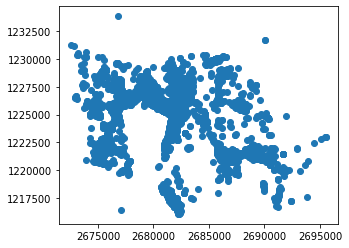

In [7]:
gdf_hr.plot()# es funktioniert

# Für Datawrapper kleiner gemacht
Dataframe mit allen Verdächtigen Adressen (ü 20 f ü 10 v)
Dieses mit den lon und lat versehen eingeben


In [8]:
df_hr=dfhr_ber

In [9]:
df_dat1=df_hr[(df_hr["Firmen"]>20)&(df_hr["Vergleich"]>5)]
df_dat1.to_csv(folderpath+"/BRFrames/Fuer_Datawrapper_auffaellige.csv")
df_dat1.sort_values("Vergleich", ascending=False)

,Adresse,Firmen,Telbuch,Vergleich,STRNAME,GDENAME,Punkt,STR_GMD
271,"Dammstrasse 16, Zug",92,3,30.666667,Dammstrasse,Zug,POINT (2681576.886 1225537.110),"Dammstrasse, Zug"
5991,"Dammstrasse 21, Zug",28,1,28.000000,Dammstrasse,Zug,POINT (2681559.203 1225668.139),"Dammstrasse, Zug"
3875,"Gulmstrasse 35, Oberägeri",24,1,24.000000,Gulmstrasse,Oberägeri,POINT (2689721.402 1221106.711),"Gulmstrasse, Oberägeri"
6116,"Grafenauweg 10, Zug",99,6,16.500000,Grafenauweg,Zug,POINT (2681379.419 1225358.758),"Grafenauweg, Zug"
312,"Baarermattstrasse 3, Baar",31,2,15.500000,Baarermattstrasse,Baar,POINT (2682491.004 1226160.999),"Baarermattstrasse, Baar"
...,...,...,...,...,...,...,...,...
6837,"Baarerstrasse 71, Zug",31,6,5.166667,Baarerstrasse,Zug,POINT (2681794.484 1225661.617),"Baarerstrasse, Zug"
311,"Rosenweg 8B, Baar",31,6,5.166667,Rosenweg,Baar,POINT (2682148.998 1226681.001),"Rosenweg, Baar"
6122,"Grienbachstrasse 17, Zug",72,14,5.142857,Grienbachstrasse,Zug,POINT (2682216.417 1226388.042),"Grienbachstrasse, Zug"
6606,"Unter Altstadt 28, Zug",41,8,5.125000,Unter Altstadt,Zug,POINT (2681541.292 1224372.852),"Unter Altstadt, Zug"


In [10]:
df_dat2=df_dat1=df_hr[(df_hr["Firmen"]>20)]
df_dat2.to_csv(folderpath+"/BRFrames/Fuer_Datawrapper_ue_20.csv")
df_dat2

,Adresse,Firmen,Telbuch,Vergleich,STRNAME,GDENAME,Punkt,STR_GMD
0,"Blegistrasse 9, Baar",43,14,3.071429,Blegistrasse,Baar,POINT (2685767.003 1230070.006),"Blegistrasse, Baar"
1,"Eichmattstrasse 97, Hünenberg See",34,4,8.500000,Eichmattstrasse,Hünenberg See,POINT (2676149.277 1225851.555),"Eichmattstrasse, Hünenberg See"
259,"Haldenstrasse 5, Baar",258,44,5.863636,Haldenstrasse,Baar,POINT (2683326.000 1227815.998),"Haldenstrasse, Baar"
260,"Gewerbestrasse 5, Cham",218,51,4.274510,Gewerbestrasse,Cham,POINT (2678423.349 1226895.162),"Gewerbestrasse, Cham"
261,"Neuhofstrasse 5A, Baar",216,34,6.352941,Neuhofstrasse,Baar,POINT (2681528.795 1227271.407),"Neuhofstrasse, Baar"
...,...,...,...,...,...,...,...,...
6940,"Chamerstrasse 115, Zug",35,13,2.692308,Chamerstrasse,Zug,POINT (2679912.890 1225830.049),"Chamerstrasse, Zug"
6947,"Chamerstrasse 14, Zug",46,11,4.181818,Chamerstrasse,Zug,POINT (2681328.691 1225108.176),"Chamerstrasse, Zug"
6950,"Chamerstrasse 172, Zug",220,27,8.148148,Chamerstrasse,Zug,POINT (2679387.226 1226125.027),"Chamerstrasse, Zug"
6954,"Chamerstrasse 176, Zug",90,9,10.000000,Chamerstrasse,Zug,POINT (2679346.948 1226153.547),"Chamerstrasse, Zug"


### Punkte in unterschiedlicher Grösse

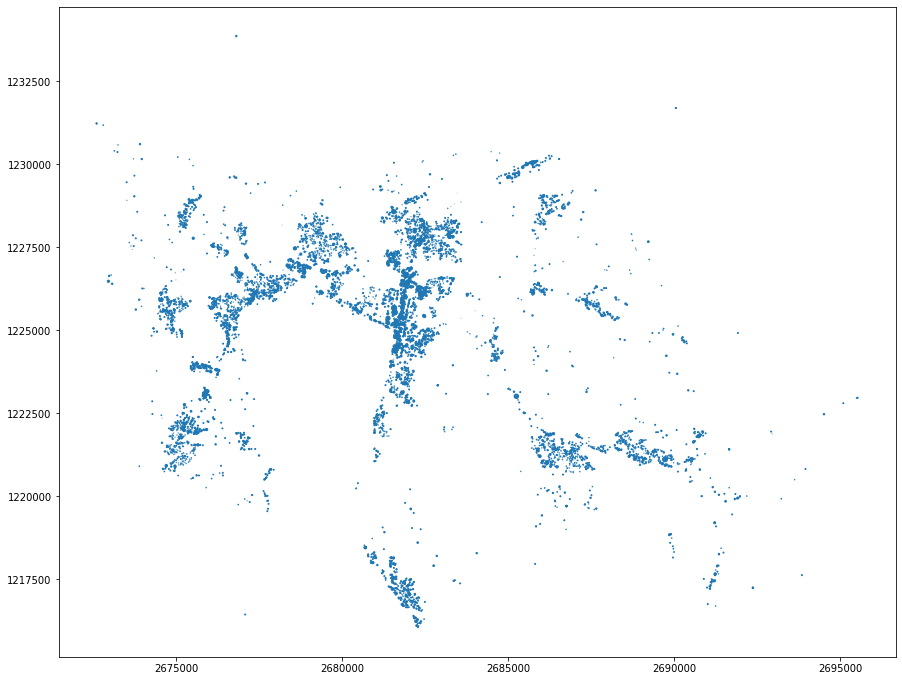

In [18]:
gdf_hr.plot(markersize=gdf_hr['Vergleich'], figsize=(15,20))

Text(0.5, 1, 'Firmensitze in der Stadt Zug')

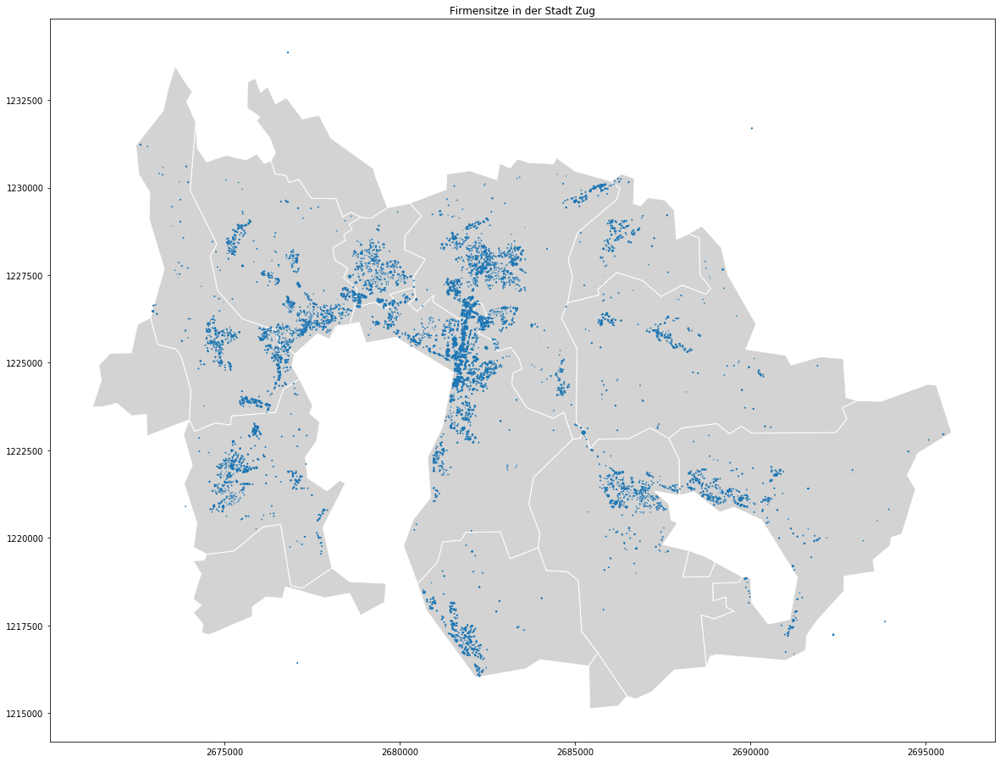

In [19]:
ax = gdf_zg.plot(figsize=(20,25), color='lightgrey', edgecolor='white')
gdf_hr.plot(figsize=(20,25), markersize=gdf_hr['Vergleich'], ax=ax)
ax.set_title("Firmensitze in der Stadt Zug")

#### Wie bringe ich die Punkte zusammen mit der Karte hin
Ich muss zuerst dem gdf_hr ein crs-Format geben. Danach in das Merkator-Format umwandeln.

In [20]:
gdf_stadtzug_es=gdf_stadtzug.to_crs(epsg=3857)#umwalndeln in Merkator
gdf_zg_es=gdf_zg.to_crs(epsg=3857) #umwalndeln in Merkator
gdf_hr.crs=({'init' :'epsg:2056'}) #Zuerst crs. geben
gdf_hr_es=gdf_hr.to_crs(epsg=3857)# umwandeln in Merkator


In [21]:
gdf_hr_es.to_csv(folderpath+"/BRFrames/ALLE_mit_Geocodes_Mercator_Format.csv")

In [22]:
gdf_zg.crs

{'init': 'epsg:2056'}

In [23]:
gdf_zg_es.crs 

{'init': 'epsg:3857', 'no_defs': True}

In [24]:
gdf_hr.crs

{'init': 'epsg:2056'}

In [25]:
gdf_hr_es.crs

{'init': 'epsg:3857', 'no_defs': True}

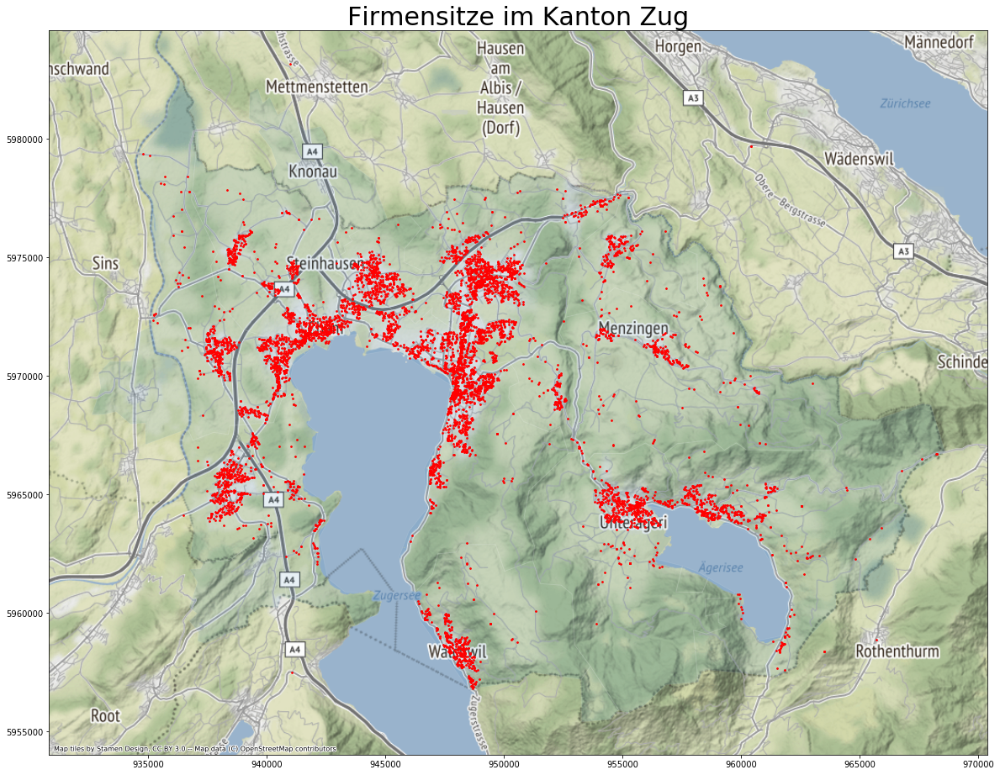

In [26]:
ax = gdf_zg_es.plot(figsize=(20,25), alpha=0.1, edgecolor='white')
gdf_hr_es.plot(figsize=(20,25), markersize=3,color="red", ax=ax)
ax.set_title("Firmensitze im Kanton Zug",fontsize=30)
ctx.add_basemap(ax)

# Die PUnkte kommen einfach nicht mehr... 
#https://gis.stackexchange.com/questions/283677/geometry-data-in-geodataframe-will-not-plot (vielleicht da was)

# Hier mit der Grösse der Firmen
Je mehr Firmen desto grösser der Punkt

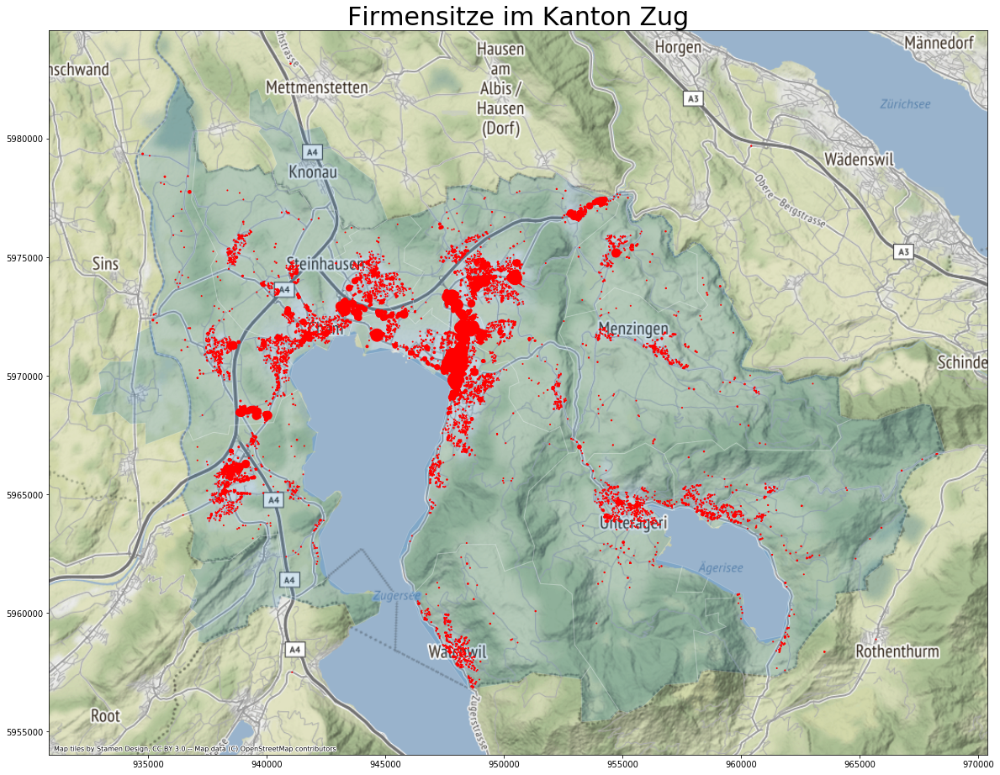

In [27]:
ax = gdf_zg_es.plot(figsize=(20,25), alpha=0.2, edgecolor='white')
gdf_hr_es.plot(figsize=(20,25), markersize=gdf_hr['Firmen'],color="red", ax=ax)
ax.set_title("Firmensitze im Kanton Zug",fontsize=30)
ctx.add_basemap(ax)


# Hier mit dem Vergleichswert 
Die Stadt Zug kristallisiert sich heraus - die anderen Hubs werden kleiner 

In [ ]:
ax = gdf_zg_es.plot(figsize=(20,25), alpha=0.2, edgecolor='white')
gdf_hr_es.plot(figsize=(20,25), markersize=gdf_hr_es['Vergleich']*3,color="red", ax=ax)
ax.set_title("Firmensitze im Kanton Zug - Punktegrösse nach Vergleichswert", fontsize=30)
ctx.add_basemap(ax)

In [ ]:
ax = gdf_zg_es.plot(figsize=(20,25), alpha=0.2, edgecolor='white')
gdf_hr_es.plot(figsize=(20,25), markersize=gdf_hr['Vergleich'],color="red", ax=ax)
#ax.set_title("Firmensitze in der Stadt Zug")
#ctx.add_basemap(ax)

In [ ]:
gdf_hr_es[(gdf_hr_es["Firmen"]>20)&(gdf_hr_es["Vergleich"]>8)].sort_values("Vergleich", ascending=False).head(50)

### Mehr als 20 Firmen und höheren Vergleichswert als 6

In [ ]:
ax = gdf_zg_es.plot(figsize=(20,25), alpha=0.2, edgecolor='white')
gdf_hr_es[(gdf_hr_es["Firmen"]>20)&(gdf_hr_es["Vergleich"]>5)].plot(figsize=(20,25), markersize=gdf_hr['Firmen'],color="red", ax=ax)
ax.set_title("Firmensitze an Adressen mit mehr als 20 Firmen und Vergleichswert über 6, in der grösse absoluter Firmenanzahl")
ctx.add_basemap(ax)

### Fokus auf Zug wobei auch die anderen reinkommen

In [ ]:
ax = gdf_zg_es[gdf_zg_es["GMDNAME"]=="Cham"].plot(figsize=(20,25), alpha=0.1, edgecolor='white')
gdf_hr_es[(gdf_hr_es["Firmen"]>20)&(gdf_hr_es["Vergleich"]>6)].plot(figsize=(20,25), markersize=gdf_hr['Vergleich']*5,color="red", ax=ax)
ax.set_title("Firmensitze mit mehr als 20 Firmen und einem höheren Vergleichswert als 6")
ctx.add_basemap(ax)

In [ ]:
gdf_hr_es[(gdf_hr_es["Firmen"]>20)]

In [ ]:
ax = gdf_zg_es[gdf_zg_es["GMDNAME"]=="Zug"].plot(figsize=(20,25), alpha=0.1, edgecolor='white')
gdf_hr_es[(gdf_hr_es["Firmen"]>20)].plot(figsize=(20,25), markersize=gdf_hr_es['Firmen'],color="red", ax=ax)
ax.set_title("Firmensitze mit mehr als 20 Firmen")
ctx.add_basemap(ax)

#### Alle Firmen leicht verschwommen um Ansammlungen besser zu erkennen

In [ ]:
ax = gdf_zg_es[gdf_zg_es["GMDNAME"]=="Zug"].plot(figsize=(20,25), alpha=0.1, edgecolor='white')
gdf_hr_es.plot(figsize=(20,25), markersize=gdf_hr_es['Firmen'],color="red",alpha=0.5, ax=ax)
ax.set_title("Firmensitze im Kanton Zug nach Anzahl Firmen")
ctx.add_basemap(ax)

In [ ]:
ax = gdf_stadtzug_es[gdf_stadtzug_es["GMDNAME"]=="Zug"].plot(figsize=(20,25), alpha=0.1, edgecolor='white')
gdf_hr_es[(gdf_hr_es["Firmen"]>15)&(gdf_hr_es["Vergleich"]>5)].plot(figsize=(20,25), markersize=gdf_hr_es['Firmen'],color="red", ax=ax)
ax.set_title("Firmensitze in der Stadt Zug")
ctx.add_basemap(ax)
ax.set_ylim([5965000,5975000])
ax.set_xlim([945000, 950000])

(945000, 950000)

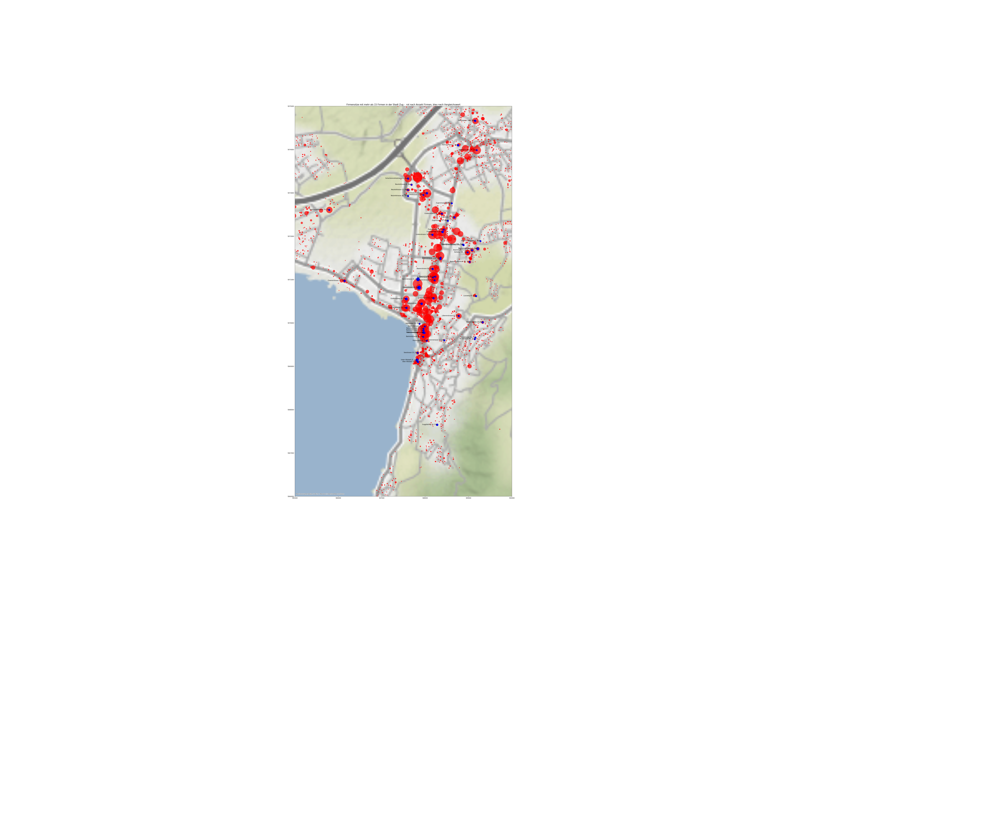

In [50]:
#Printversion Stadt nah
gdf_auff=gdf_hr_es.sort_values("Vergleich",ascending=False).head(100)
ax = gdf_stadtzug_es[gdf_stadtzug_es["GMDNAME"]=="Zug"].plot(figsize=(40,50), alpha=0, edgecolor='white')
gdf_hr_es.plot(figsize=(40,50), markersize=gdf_hr_es['Firmen']*20,alpha=0.7,color="red", ax=ax)
#gdf_hr_es[(gdf_hr_es["Firmen"]>15)&(gdf_hr_es["Vergleich"]>5)].plot(figsize=(40,50), markersize=gdf_hr_es['Vergleich']*40,color="blue",alpha=1, ax=ax)
gdf_auff.plot(figsize=(40,50), markersize=gdf_auff['Vergleich']*20,color="blue",alpha=1, ax=ax)
gdf_auff.apply(lambda x: ax.annotate(s=x.Adresse, xy=x.Punkt.centroid.coords[0], ha='right'),axis=1)
ax.set_title("Firmensitze mit mehr als 15 Firmen in der Stadt Zug -  rot nach Anzahl Firmen, blau nach Vergleichswert", fontsize=15)
ctx.add_basemap(ax)
ax.set_ylim([5966000,5975000])
ax.set_xlim([945000, 950000])

In [ ]:
ax = gdf_zg_es.plot(figsize=(20,25), alpha=0, edgecolor='white')
gdf_hr_es[(gdf_hr_es["Firmen"]>15)].plot(figsize=(20,25), markersize=gdf_hr_es['Firmen']*3,color="red", ax=ax)
gdf_hr_es[(gdf_hr_es["Firmen"]>15)&(gdf_hr_es["Vergleich"]>5)].plot(figsize=(20,25), markersize=gdf_hr_es['Vergleich']*15,color="blue",alpha=1, ax=ax)
ax.set_title("Firmensitze mit mehr als 15 Firmen in der Stadt Zug -  rot nach Anzahl Firmen, blau nach Vergleichswert", fontsize=15)

ax.set_ylim([5968000,5975000])
ax.set_xlim([945000, 950000])

In [ ]:
ax = gdf_zg_es[gdf_zg_es["GMDNAME"]=="Zug"].plot(figsize=(20,25), alpha=0.1, edgecolor='white')
gdf_hr_es[(gdf_hr_es["Firmen"]>15)].plot(figsize=(20,25), markersize=gdf_hr_es['Firmen']*2,color="red",alpha=1, ax=ax)
gdf_hr_es[(gdf_hr_es["Firmen"]>15)&(gdf_hr_es["Vergleich"]>5)].plot(figsize=(20,25), markersize=gdf_hr_es['Vergleich']*15,color="blue",alpha=1, ax=ax)
ax.set_title("Firmensitze in Cham nach Anzahl Firmen und Vergleichswert")
ctx.add_basemap(ax)
ax.set_ylim([5968000,5975000])
ax.set_xlim([940000, 945000])

In [ ]:
ax = gdf_zg_es[gdf_zg_es["GMDNAME"]=="Zug"].plot(figsize=(20,25), alpha=0.1, edgecolor='white')
gdf_hr_es.plot(figsize=(20,25), markersize=gdf_hr_es['Firmen'],color="red",alpha=0.5, ax=ax)
gdf_hr_es[(gdf_hr_es["Firmen"]>15)&(gdf_hr_es["Vergleich"]>5)].plot(figsize=(20,25), markersize=gdf_hr_es['Vergleich']*3,color="blue",alpha=0.5, ax=ax)
ax.set_title("Firmensitze im Kanton Zug - rot nach Anzahl Firmen, blau nach Vergleichswert", fontsize=20)
ctx.add_basemap(ax)


In [52]:
gdf_hr_es.sort_values("Vergleich", ascending=False).head(200)

,Adresse,Firmen,Telbuch,Vergleich,STRNAME,GDENAME,Punkt,STR_GMD
271,"Dammstrasse 16, Zug",92,3,30.666667,Dammstrasse,Zug,POINT (947859.795 5970810.144),"Dammstrasse, Zug"
5991,"Dammstrasse 21, Zug",28,1,28.000000,Dammstrasse,Zug,POINT (947836.468 5971003.494),"Dammstrasse, Zug"
3875,"Gulmstrasse 35, Oberägeri",24,1,24.000000,Gulmstrasse,Oberägeri,POINT (959720.213 5964114.614),"Gulmstrasse, Oberägeri"
325,"Zugerstrasse 195, Unterägeri",20,1,20.000000,Zugerstrasse,01 Unterägeri,POINT (953189.527 5967008.714),"Zugerstrasse, Unterägeri"
6601,"Unter Altstadt 15, Zug",19,1,19.000000,Unter Altstadt,Zug,POINT (947814.351 5969141.089),"Unter Altstadt, Zug"
...,...,...,...,...,...,...,...,...
6395,"Lüssiweg 41, Zug",5,1,5.000000,Lüssiweg,Zug,POINT (949148.421 5970654.921),"Lüssiweg, Zug"
579,"Obersecki 5, Walchwil",5,1,5.000000,Obersecki,Walchwil,POINT (948445.847 5957985.866),"Obersecki, Walchwil"
3948,"Hauptstrasse 74, Oberägeri",5,1,5.000000,Hauptstrasse,Oberägeri,POINT (957677.967 5964567.613),"Hauptstrasse, Oberägeri"
572,"Schmiedstrasse 4, Cham",5,1,5.000000,Schmiedstrasse,Cham,POINT (941764.084 5971826.103),"Schmiedstrasse, Cham"


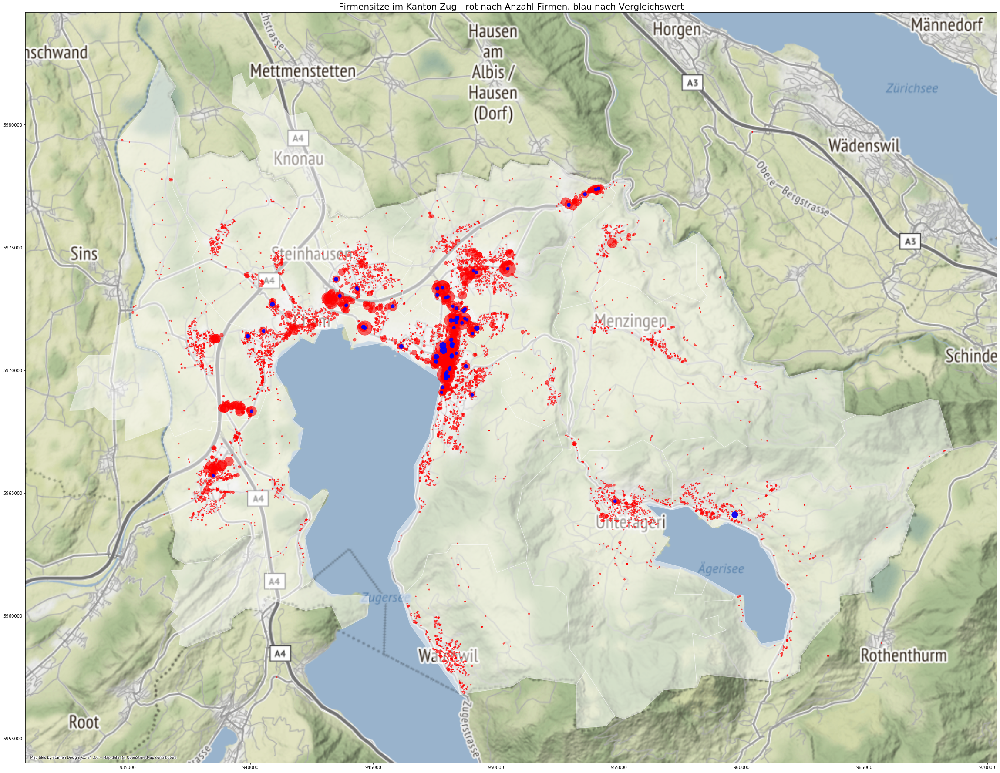

In [32]:
#Printversion Kanton
gdf_auff=gdf_hr_es[(gdf_hr_es["Firmen"]>20)&(gdf_hr_es["Vergleich"]>5)] #zuerst in ein eigenes Frame umwandeln

ax = gdf_zg_es.plot(figsize=(40,50), color="white",alpha=0.5, edgecolor='white')
gdf_hr_es.plot(figsize=(40,50), markersize=gdf_hr_es['Firmen']*5,color="red",alpha=0.6, ax=ax)
gdf_auff.plot(figsize=(40,50), markersize=gdf_auff['Vergleich']*8,color="blue",alpha=0.9, ax=ax)
ax.set_title("Firmensitze im Kanton Zug - rot nach Anzahl Firmen, blau nach Vergleichswert", fontsize=20)
ctx.add_basemap(ax)
#ax.set_ylim([5955000,5980000])
#ax.set_xlim([933000, 964000])

(935000, 962500)

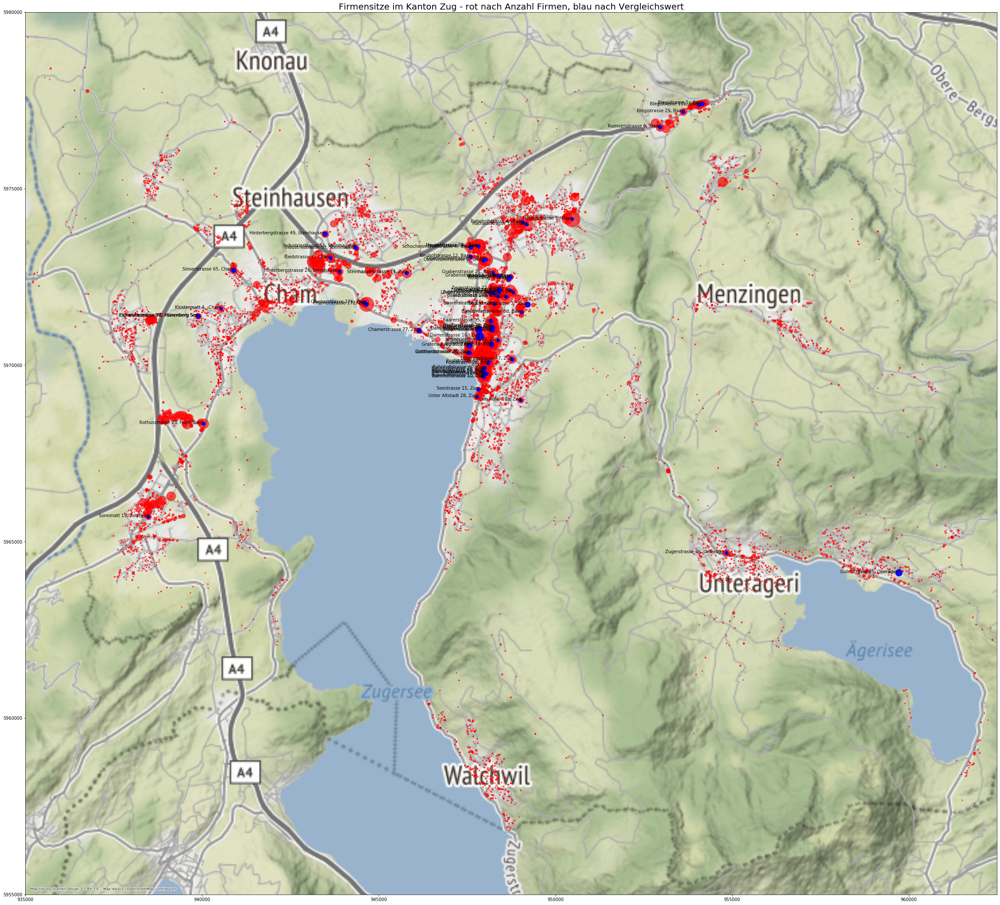

In [58]:
gdf_auff=gdf_hr_es[(gdf_hr_es["Firmen"]>20)&(gdf_hr_es["Vergleich"]>5)]
#gdf_auff=gdf_hr_es.sort_values("Vergleich",ascending=False).head(100)

ax = gdf_zg_es[gdf_zg_es["GMDNAME"]=="Zug"].plot(figsize=(40,50), alpha=0.0, edgecolor='white')
gdf_hr_es.plot(figsize=(40,50), markersize=gdf_hr_es['Firmen']*5,color="red",alpha=0.65, ax=ax)
gdf_auff.plot(figsize=(40,50), markersize=gdf_auff['Vergleich']*10,color="blue",alpha=0.9, ax=ax)
gdf_auff.apply(lambda x: ax.annotate(s=x.Adresse, xy=x.Punkt.centroid.coords[0], ha='right'),axis=1); #zum beschriften
ax.set_title("Firmensitze im Kanton Zug - rot nach Anzahl Firmen, blau nach Vergleichswert", fontsize=20)
ctx.add_basemap(ax)
ax.set_ylim([5955000,5980000])
ax.set_xlim([935000, 962500])

# Weitere Ideen:
Gemeinden anschauen: 

- Wo ist der höchste Vergleichswert?
- Welche Gemeinde hat am meisten Firmen.
- Anzahl Firmen pro Gemeinde mit Einwohnerzahl vergleichen

In [ ]:
ax = gdf_zg_es.plot(column='Firmen', cmap='Blues', scheme='quantiles', edgecolor='white', legend=True, figsize=(12,12))
ax.set_title('Anzahl denkmalgeschützte Objekte pro Gemeinde')